# Image reconstruction from Convolutional Neural Networks


I wanted to understand what a neural network "sees" by searching with gradient descent for images that excite the network in a given way.

1. Method to find images that excite selected neurons. 
2. Google's DeepDream.
3. Adversarial image. 
4. Style transfer.
5. Texture Transfer.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [ ]:
!pip install -q gdown httpimport

In [ ]:
# Torch has to go first due to an importing bug
import collections
import logging
import os
import re

import httpimport
import numpy as np
import PIL
import scipy.io
import scipy.ndimage

import torch
import torch.nn.functional as F
import torchvision
from torch import nn
from torch.autograd import Variable
from tqdm import tqdm
import cv2
from IPython import display

logging.getLogger("PIL").setLevel(logging.INFO)


with httpimport.github_repo(
    "janchorowski", "nn_assignments", module="common", branch="nn18"
):
    import common.plotting

In [ ]:
# We strongly recommend training using CUDA
CUDA = True


def to_np(x):
    return x.detach().cpu().numpy()


def to_tensor(x, requires_grad=False):
    x = torch.from_numpy(x)
    if CUDA:
        x = x.cuda()
    # return torch.tensor(x, **kwargs)
    if requires_grad:
        return x.clone().contiguous().detach().requires_grad_(True)
    else:
        return x.clone().contiguous().detach()

In [ ]:
def load_image(path):

    transforms = [
        torchvision.transforms.Resize(256),
        torchvision.transforms.CenterCrop(224),
    ]

    img = PIL.Image.open(path)
    img = img.convert("RGB")
    for t in transforms:
        img = t(img)
    return numpy.asarray(img).astype("float32") / 255.0

In [ ]:
class ILSVRC2014Sample(object):
    """Mapper from numerical class IDs to their string LABELS and DESCRIPTIONS.
    
    Please use the dicts:
    - id_to_label and label_to_id to convert string labels and numerical ids
    - label_to_desc to get a textual description of a class label
    - id_to_desc to directly get descriptions for numerical IDs
    
    """

    def load_image(self, path):
        img = PIL.Image.open(path)
        img = img.convert("RGB")
        for t in self.transforms:
            img = t(img)
        return numpy.asarray(img).astype("float32") / 255.0

    def __init__(self, num=100):
        self.transforms = [
            torchvision.transforms.Resize(256),
            torchvision.transforms.CenterCrop(224),
        ]

        base_dir = "ilsvrc_subsample/"
        devkit_dir = base_dir

        meta = scipy.io.loadmat(devkit_dir + "/meta.mat")
        imagenet_class_names = []
        self.label_to_desc = {}
        for i in range(1000):
            self.label_to_desc[meta["synsets"][i][0][1][0]] = meta["synsets"][i][0][2][
                0
            ]
            imagenet_class_names.append(meta["synsets"][i][0][1][0])

        img_names = sorted(os.listdir(base_dir + "/img"))[:num]
        img_ids = {int(re.search("\d{8}", name).group()) for name in img_names}
        with open(devkit_dir + "/ILSVRC2012_validation_ground_truth.txt", "r") as f:
            self.labels = [
                imagenet_class_names[int(line.strip()) - 1]
                for i, line in enumerate(f)
                if i + 1 in img_ids
            ]
        self.data = [self.load_image(base_dir + "/img/" + name) for name in img_names]

        self.id_to_label = sorted(self.label_to_desc.keys())
        self.label_to_id = {}
        self.id_to_desc = []
        for id_, label in enumerate(self.id_to_label):
            self.label_to_id[label] = id_
            self.id_to_desc.append(self.label_to_desc[label])

In [ ]:
class VGGPreprocess(torch.nn.Module):
    """Pytorch module that normalizes data for a VGG network
    """

    # These values are taken from http://pytorch.org/docs/master/torchvision/models.html
    RGB_MEANS = torch.FloatTensor([0.485, 0.456, 0.406])[None, :, None, None]
    RGB_STDS = torch.FloatTensor([0.229, 0.224, 0.225])[None, :, None, None]

    def forward(self, x):
        """Normalize a single image or a batch of images
        
        Args:
            x: a pytorch Variable containing and float32 RGB image tensor with 
              dimensions (batch_size x width x heigth x RGB_channels) or 
              (width x heigth x RGB_channels).
        Returns:
            a torch Variable containing a normalized BGR image with shape 
              (batch_size x BGR_channels x width x heigth)
        """
        if x.dim() == 3:
            x = torch.unsqueeze(x, 0)
        # x is batch * width * heigth *channels,
        # make it batch * channels * width * heigth
        if x.size(3) == 3:
            x = x.permute(0, 3, 1, 2).contiguous()
        means = self.RGB_MEANS
        stds = self.RGB_STDS
        if x.is_cuda:
            means = means.cuda()
            stds = stds.cuda()
        x = (x - Variable(means)) / Variable(stds)
        return x

    def denorm(self, x):
      
        means = self.RGB_MEANS
        stds = self.RGB_STDS

        if x.is_cuda:
            means = means.cuda()
            stds = stds.cuda()

        x = x * Variable(stds) + Variable(means)
        return x


class VGG(torch.nn.Module):
    """Wrapper around a VGG network allowing convenient extraction of layer activations.
    
    """

    FEATURE_LAYER_NAMES = {
        "vgg16": [
            "conv1_1",
            "relu1_1",
            "conv1_2",
            "relu1_2",
            "pool1" "conv2_1",
            "relu2_1",
            "conv2_2",
            "relu2_2",
            "pool2" "conv3_1",
            "relu3_1",
            "conv3_2",
            "relu3_2",
            "conv3_3",
            "relu3_3",
            "pool3" "conv4_1",
            "relu4_1",
            "conv4_2",
            "relu4_2",
            "conv4_3",
            "relu4_3",
            "pool4" "conv5_1",
            "relu5_1",
            "conv5_2",
            "relu5_2",
            "conv5_3",
            "relu5_3",
            "pool5",
        ],
        "vgg19": [
            "conv1_1",
            "relu1_1",
            "conv1_2",
            "relu1_2",
            "pool1",
            "conv2_1",
            "relu2_1",
            "conv2_2",
            "relu2_2",
            "pool2",
            "conv3_1",
            "relu3_1",
            "conv3_2",
            "relu3_2",
            "conv3_3",
            "relu3_3",
            "conv3_4",
            "relu3_4",
            "pool3",
            "conv4_1",
            "relu4_1",
            "conv4_2",
            "relu4_2",
            "conv4_3",
            "relu4_3",
            "conv4_4",
            "relu4_4",
            "pool4",
            "conv5_1",
            "relu5_1",
            "conv5_2",
            "relu5_2",
            "conv5_3",
            "relu5_3",
            "conv5_4",
            "relu5_4",
            "pool5",
        ],
    }

    def __init__(self, model="vgg19"):
        super(VGG, self).__init__()
        all_models = {
            "vgg16": torchvision.models.vgg16,
            "vgg19": torchvision.models.vgg19,
        }
        vgg = all_models[model](pretrained=True)

        self.preprocess = VGGPreprocess()
        self.features = vgg.features
        self.classifier = vgg.classifier
        self.softmax = torch.nn.Softmax(dim=-1)

        self.feature_names = self.FEATURE_LAYER_NAMES[model]

        assert len(self.feature_names) == len(self.features)

    def forward(self, x):
        """ Return pre-softmax unnormalized logits. 
        """
        x = self.preprocess(x)
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

    def probabilities(self, x):
        """Return class probabilities.
        """
        logits = self(x)
        return self.softmax(logits)

    def layer_activations(self, x, layer_name):
        """Return activations of a selected layer.
        """
        for name, layer in zip(self.feature_names, self.features):
            x = layer(x)
            if name == layer_name:
                return x
        raise ValueError("Layer %s not found" % layer_name)

    def multi_layer_activations(self, x, layer_names):
        """Return activations of all requested layers.
        """
        layer_activations = [None] * len(layer_names)
        for name, layer in zip(self.feature_names, self.features):
            x = layer(x)
            if name in layer_names:
                layer_activations[layer_names.index(name)] = x
        assert not None in layer_activations
        return layer_activations

    def predict(self, x):
        """Return predicted class IDs.
        """
        logits = self(x)
        return torch.argmax(self.softmax(logits), axis = 1)


vgg = VGG("vgg19")

if CUDA:
    vgg.cuda()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


In [ ]:
# List layers in the model
print("Feature layers")
print("--------------")
for name, layer in zip(vgg.feature_names, vgg.features):
    print("{1: <12} {0: <8}  ({2}".format(name, *str(layer).split("(", 1)))
print("\nClassifier layers")
print("-----------------")
for layer in vgg.classifier:
    print("{: <12}({}".format(*str(layer).split("(", 1)))

Feature layers
--------------
Conv2d       conv1_1   (3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu1_1   (inplace=True)
Conv2d       conv1_2   (64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu1_2   (inplace=True)
MaxPool2d    pool1     (kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d       conv2_1   (64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu2_1   (inplace=True)
Conv2d       conv2_2   (128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu2_2   (inplace=True)
MaxPool2d    pool2     (kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d       conv3_1   (128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_1   (inplace=True)
Conv2d       conv3_2   (256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU         relu3_2   (inplace=True)
Conv2d       conv3_3   (256, 256, kernel_size=(3, 3), stride

In [ ]:
def plot_img(img, fig_size=(7, 7)):
    fig, ax = plt.subplots(figsize=fig_size)
    ax.imshow(img)
    plt.show()

## 1. Convolutional Features

In [ ]:
class FilterVisualizer():
    def __init__(self, model, size=56, upscaling_steps=12, upscaling_factor=1.2):
        self.size = size
        self.upscaling_steps = upscaling_steps
        self.upscaling_factor =  upscaling_factor
        self.preprocess = VGGPreprocess()
        self.model = vgg.eval()
        for param in model.parameters():
            param.requires_grad = False

    def visualize(self, layer, filter, lr=0.1, opt_steps=20, blur = 5):
        sz = self.size
        img = np.uint8(np.random.uniform(100, 200, (sz, sz, 3)))/255
        img = img.astype(np.float32)

        for _ in tqdm(range(self.upscaling_steps)):

            img_var = to_tensor(img)[None]
            img_var = self.preprocess(img_var)
            img_var = F.interpolate(img_var, 224)
            optimizer = torch.optim.Adam([img_var.requires_grad_(True)], lr=lr, weight_decay=1e-6)

            for n in range(opt_steps): 
                optimizer.zero_grad()
                layer_a = self.model.layer_activations(img_var, layer)
                loss = -layer_a[0, filter].mean()
                loss.backward()
                optimizer.step()

            img = self.preprocess.denorm(img_var)
            img = F.interpolate(img, sz) 
            img = to_np(img)[0].transpose(1,2,0)
            self.img = img
            sz = int(self.upscaling_factor * sz)
            img = cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)
            if blur is not None: img = cv2.blur(img, (blur,blur))

        plot_img(np.clip(self.img, 0, 1))

    def find_ex_filters(self, img, layer, top=3):

        img = to_tensor(img)[None]

        layer_a = self.model.layer_activations(self.preprocess(img), layer)
        
        res = []
        for i in range(layer_a.shape[1]):
            res.append(layer_a[0, i].abs().mean())
        
        return argsort(res)[-top:]

In [ ]:
fv = FilterVisualizer(vgg, size=56, upscaling_steps=12)

100%|██████████| 12/12 [00:03<00:00,  3.96it/s]


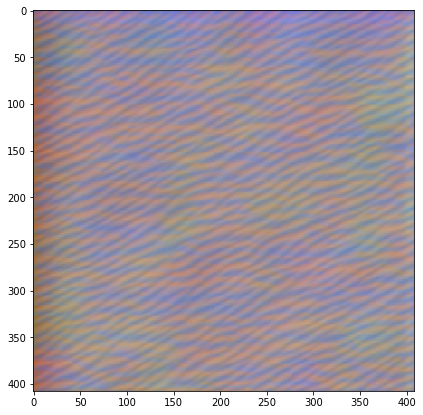

In [ ]:
fv.visualize("conv2_1", 80, lr=0.03, opt_steps=20)

100%|██████████| 12/12 [00:03<00:00,  3.34it/s]


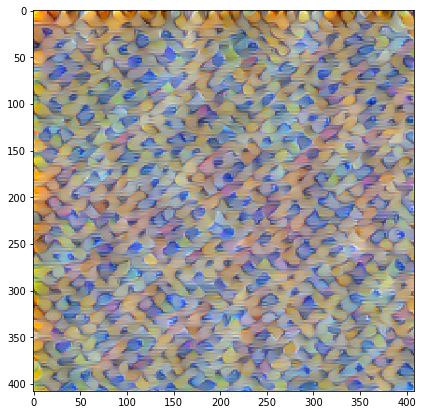

In [ ]:
fv.visualize("conv3_2", 50, opt_steps=12, lr=0.06)

100%|██████████| 12/12 [00:05<00:00,  2.36it/s]


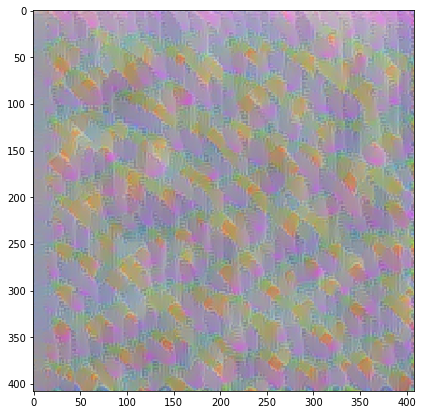

In [ ]:
fv.visualize("conv3_2", 70, opt_steps=17, lr=0.02)

100%|██████████| 12/12 [00:04<00:00,  2.82it/s]


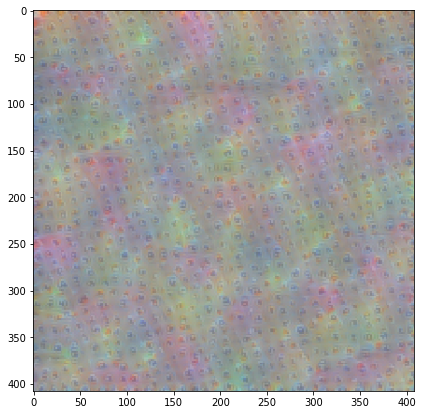

In [ ]:
fv.visualize("conv3_3", 140, opt_steps=12, lr=0.02)

100%|██████████| 12/12 [00:08<00:00,  1.50it/s]


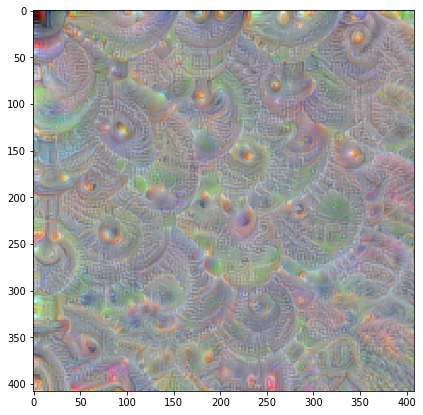

In [ ]:
fv.visualize("conv5_3", 351, opt_steps=12, lr=0.04)

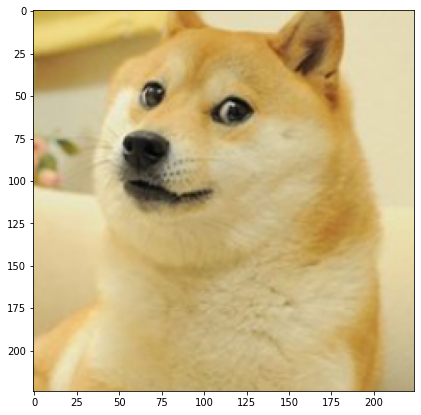

In [ ]:
img = load_image('/content/doge.jpg')
plot_img(img)

In [ ]:
fv.find_ex_filters(img, "conv5_3", 15)

array([115, 118, 299, 307, 174, 414, 175, 150, 191,  98, 419,  20, 328,
        74, 348])

100%|██████████| 12/12 [00:09<00:00,  1.24it/s]


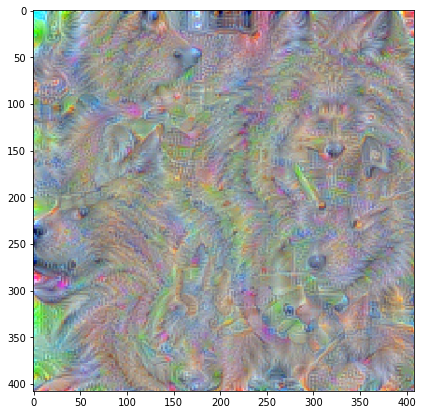

In [ ]:
fv.visualize("conv5_4", 171, opt_steps=14, lr=0.05)

100%|██████████| 12/12 [00:08<00:00,  1.44it/s]


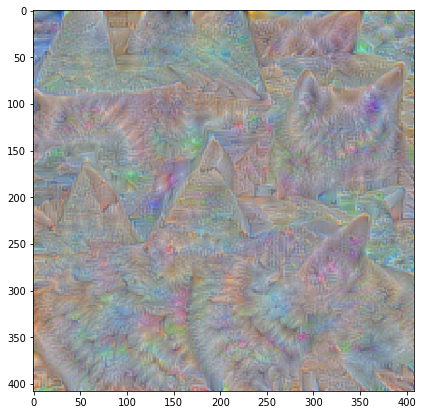

In [ ]:
fv.visualize("conv5_4", 351, opt_steps=12, lr=0.04)

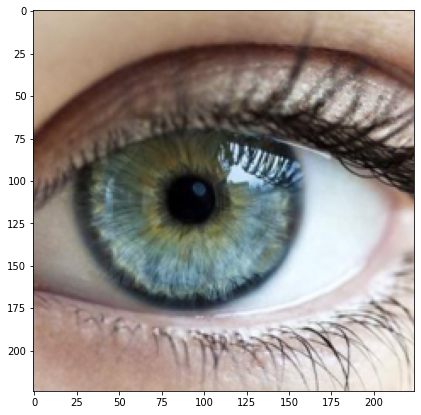

In [ ]:
img = load_image('/content/eye.jpg')
plot_img(img)

In [ ]:
fv.find_ex_filters(img, "conv5_3", 15)

array([ 55, 210, 454,  82, 319, 481, 451, 406, 328, 157, 380, 503,  91,
         2, 453])

100%|██████████| 12/12 [00:01<00:00,  7.78it/s]


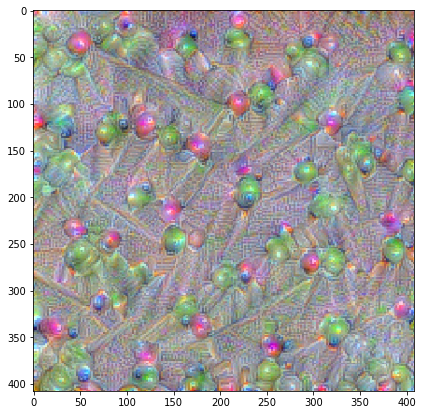

In [ ]:
fv.visualize("conv5_1", 331, opt_steps=7)

100%|██████████| 12/12 [00:07<00:00,  1.58it/s]


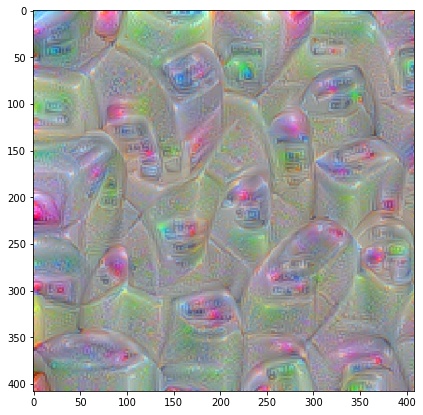

In [ ]:
fv.visualize("conv5_1", 184, opt_steps=12, lr=0.04)

## DEEP DREAM

In [ ]:
class DeepDream():
    def __init__(self, model):

        self.preprocess = VGGPreprocess()
        self.model = vgg.eval()
        for param in model.parameters():
            param.requires_grad = False

    def dream(self, image, layer, channels=None, lr=0.2, opt_steps=5, try_resize=5):


        for _ in range(try_resize):

          img_var = to_tensor(image)[None]
          img_var = self.preprocess(img_var)
          img_var = F.interpolate(img_var, 224)

          deep_img = torch.autograd.Variable(img_var, requires_grad=True)
          self.model.zero_grad()

          for _ in range(opt_steps):
              
              layer_a = self.model.layer_activations(deep_img, layer)
              if channels == None:
                  loss = layer_a.norm()
              else:
                  loss = layer_a[0, channels].norm()
              loss.backward()
              deep_img.data = deep_img.data + lr * deep_img.grad.data

          img = self.preprocess.denorm(deep_img)
          img = to_np(img)[0].transpose(1,2,0)
          self.img = img
          new_h = np.random.randint(200, 400)
          new_l = np.random.randint(200, 400)
          image = cv2.resize(img, (new_h, new_l), interpolation = cv2.INTER_CUBIC)

        plot_img(self.img)

In [ ]:
dreamer = DeepDream(vgg)

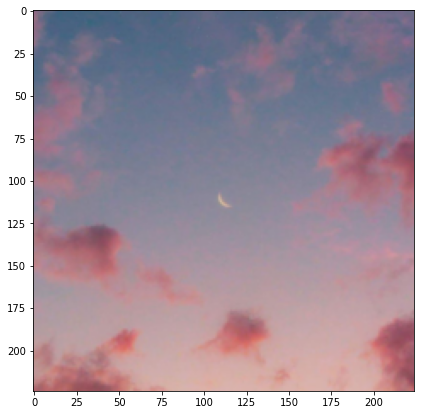

In [ ]:
img = load_image('/content/sky.jpg')
plot_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


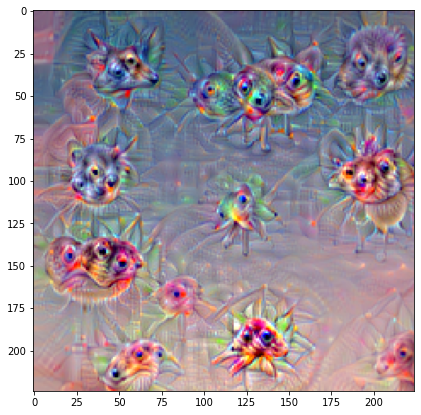

In [ ]:
dreamer.dream(img, layer="conv5_1", opt_steps=5, try_resize=20, lr=0.005)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


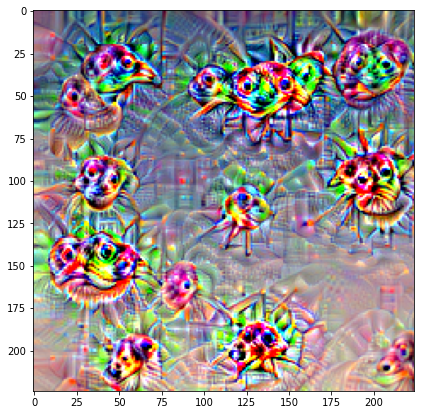

In [ ]:
dreamer.dream(img, layer="conv5_1", opt_steps=10, try_resize=20, lr=0.005)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


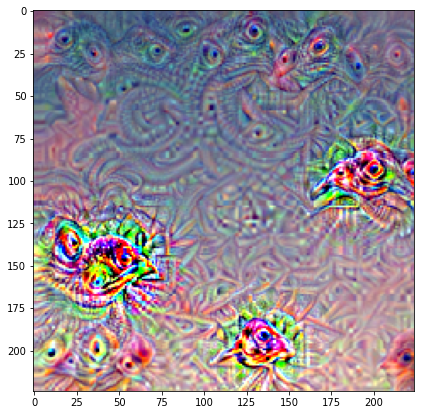

In [ ]:
dreamer.dream(img, layer="conv5_2", opt_steps=1, try_resize=20)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


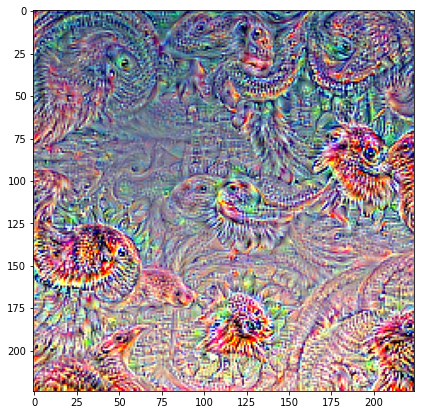

In [ ]:
dreamer.dream(img, layer="conv5_1", channels = torch.tensor([374, 223, 240, 182, 419, 445, 404, 469, 345, 280, 344, 463, 184, 331, 377]) , opt_steps=10, try_resize=1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


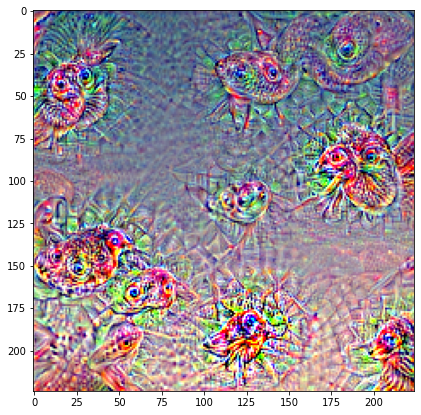

In [ ]:
dreamer.dream(img, layer="conv5_1", opt_steps=3, try_resize=3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


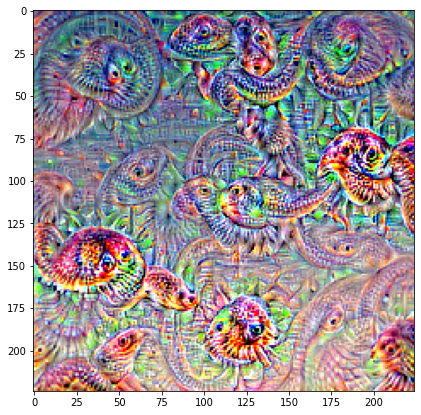

In [ ]:
dreamer.dream(img, layer="conv5_1", channels = torch.tensor([374, 223, 240, 182, 419, 445, 404, 469, 345, 280, 344, 463, 184, 331, 377]))

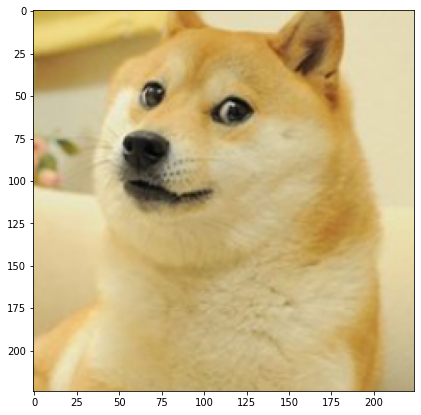

In [ ]:
img = load_image('/content/doge.jpg')
plot_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


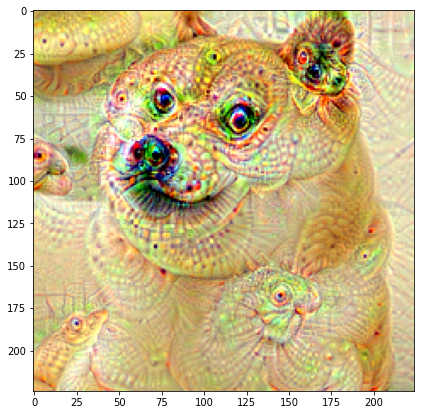

In [ ]:
dreamer.dream(img, layer="conv5_1", opt_steps=1, try_resize=10)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


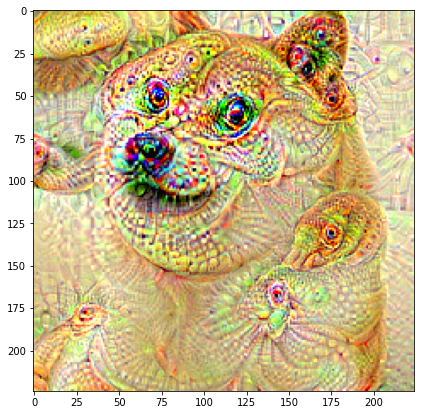

In [ ]:
dreamer.dream(img, layer="conv5_1", opt_steps=2, try_resize=5)

## Adversial Images

In [ ]:
![ -e ilsvrc_subsample.tar.bz2 ] || gdown 'https://drive.google.com/uc?id=1Y9xfTe9rjvFiX5N9DZqCRm83zHtQUBDC' -O ilsvrc_subsample.tar.bz2
![ -d ilsvrc_subsample ] || tar jxf ilsvrc_subsample.tar.bz2

Downloading...
From: https://drive.google.com/uc?id=1Y9xfTe9rjvFiX5N9DZqCRm83zHtQUBDC
To: /content/ilsvrc_subsample.tar.bz2
25.5MB [00:00, 156MB/s]


In [ ]:
class ILSVRC2014Sample(object):
    """Mapper from numerical class IDs to their string LABELS and DESCRIPTIONS.
    
    Please use the dicts:
    - id_to_label and label_to_id to convert string labels and numerical ids
    - label_to_desc to get a textual description of a class label
    - id_to_desc to directly get descriptions for numerical IDs
    
    """

    def load_image(self, path):
        img = PIL.Image.open(path)
        img = img.convert("RGB")
        for t in self.transforms:
            img = t(img)
        return numpy.asarray(img).astype("float32") / 255.0

    def __init__(self, num=100):
        self.transforms = [
            torchvision.transforms.Resize(256),
            torchvision.transforms.CenterCrop(224),
        ]

        base_dir = "ilsvrc_subsample/"
        devkit_dir = base_dir

        meta = scipy.io.loadmat(devkit_dir + "/meta.mat")
        imagenet_class_names = []
        self.label_to_desc = {}
        for i in range(1000):
            self.label_to_desc[meta["synsets"][i][0][1][0]] = meta["synsets"][i][0][2][
                0
            ]
            imagenet_class_names.append(meta["synsets"][i][0][1][0])

        img_names = sorted(os.listdir(base_dir + "/img"))[:num]
        img_ids = {int(re.search("\d{8}", name).group()) for name in img_names}
        with open(devkit_dir + "/ILSVRC2012_validation_ground_truth.txt", "r") as f:
            self.labels = [
                imagenet_class_names[int(line.strip()) - 1]
                for i, line in enumerate(f)
                if i + 1 in img_ids
            ]
        self.data = [self.load_image(base_dir + "/img/" + name) for name in img_names]

        self.id_to_label = sorted(self.label_to_desc.keys())
        self.label_to_id = {}
        self.id_to_desc = []
        for id_, label in enumerate(self.id_to_label):
            self.label_to_id[label] = id_
            self.id_to_desc.append(self.label_to_desc[label])

ilsvrc = ILSVRC2014Sample(40)

In [ ]:
def classify_my_image(img, prob_to_plot = 5):

    img_torch = to_tensor(img)
    id_probs = to_np(vgg.probabilities(img_torch)).reshape(-1)
    best_ids = np.argsort(id_probs)[-prob_to_plot:][::-1]
    predicted_labels = [ilsvrc.id_to_label[id] for id in best_ids]
    predicted_desc = [ilsvrc.label_to_desc[label] for label in predicted_labels]

    f, ax = plt.subplots(1, 2, figsize=(10,10))
    ax[0].imshow(img)
    ax[0].axis('off')

    probs = id_probs[best_ids]
    ax[1].barh(predicted_desc, probs, height=0.8)
    for i, (name, prob) in enumerate(zip(predicted_desc, probs)):
#        ax[1].text(s=name+" "+str(best_ids[i]), x=prob+0.3, y=i, color="black", horizontalalignment="left", verticalalignment="center", size=18)
        ax[1].text(s=name+" "+str(best_ids[i])+" "+str(round(prob*100, 2))+"%", x=prob, y=i, color="black",
               verticalalignment="center", horizontalalignment="left", size=18)

    
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].axis("off")
    ax[1].invert_yaxis()
    plt.show() 

In [ ]:
def adv_img(img, target, epsilon=0.1, prec=0.1):

    def attack(image, data_grad_):
        sign_data_grad = data_grad_.sign()
        new_image = image + epsilon * sign_data_grad
        new_image[int(s*prec):int(s*(1-prec)), int(s*prec):int(s*(1-prec))] = image[int(s*prec):int(s*(1-prec)), int(s*prec):int(s*(1-prec))]
        return torch.clamp(new_image, 0, 1)

    s, _, _ = img.shape
    Loss = nn.CrossEntropyLoss()
    for _ in range(20):
        vgg.zero_grad()

        img_torch = to_tensor(img)
        img_torch.requires_grad = True

        preds = vgg.probabilities(img_torch)

        loss = Loss(preds, to_tensor(target))

        loss.backward()

        img_grad = img_torch.grad.data

        img = to_np(attack(img_torch, img_grad))

    return img

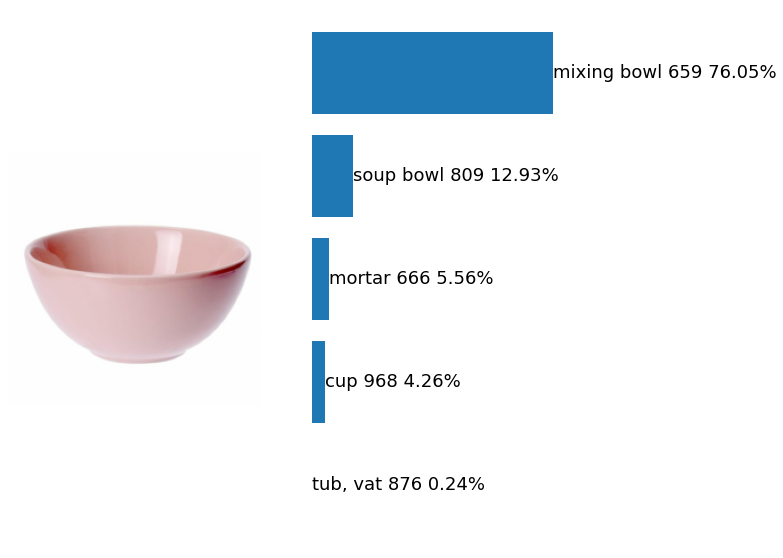

In [ ]:
img = load_image('/content/drive/MyDrive/nnimages/bowl.jpg')
classify_my_image(img)

In [ ]:
new_img = adv_img(img, np.array([659]), 0.03, 0.1)

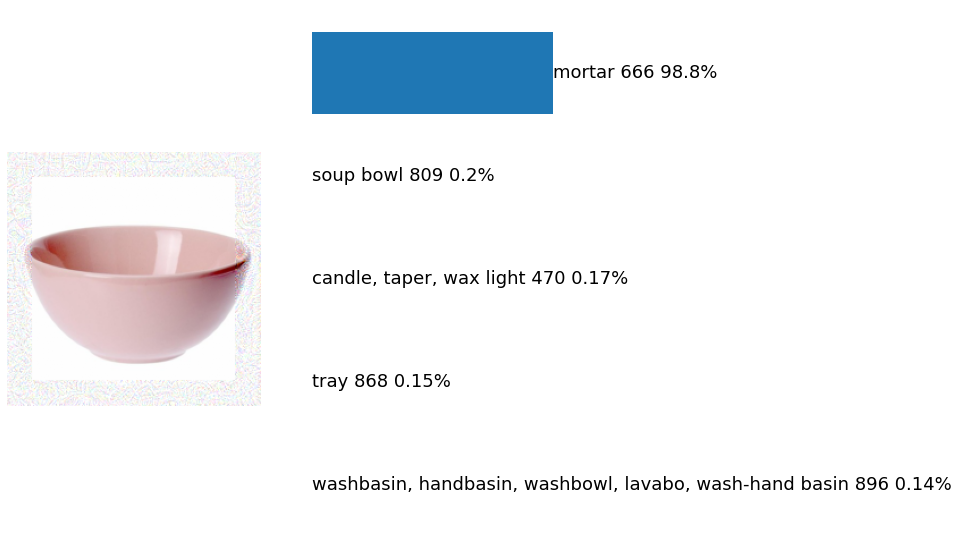

In [ ]:
classify_my_image(new_img)

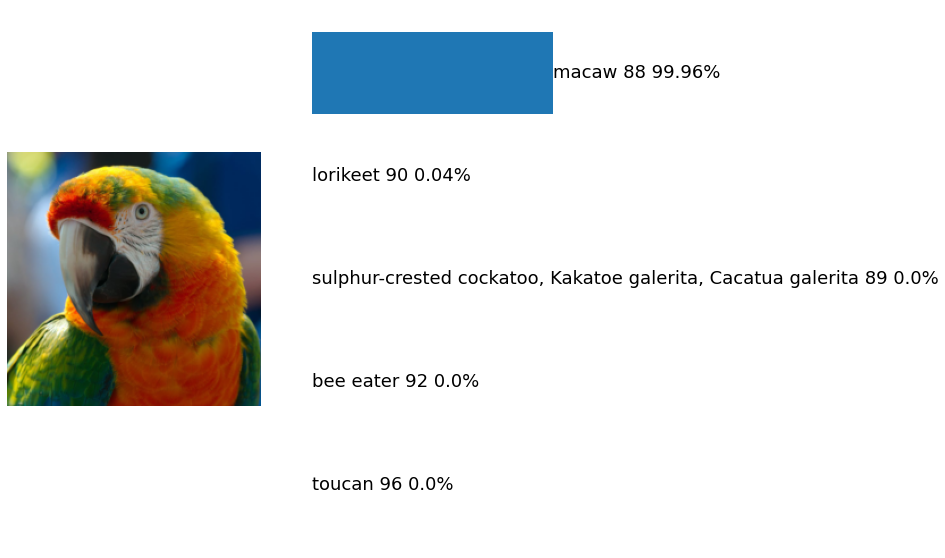

In [ ]:
img = load_image('/content/drive/MyDrive/nnimages/parrot.jpg')
classify_my_image(img)

In [ ]:
new_img = adv_img(img, np.array([88]), 0.02, 0.5)

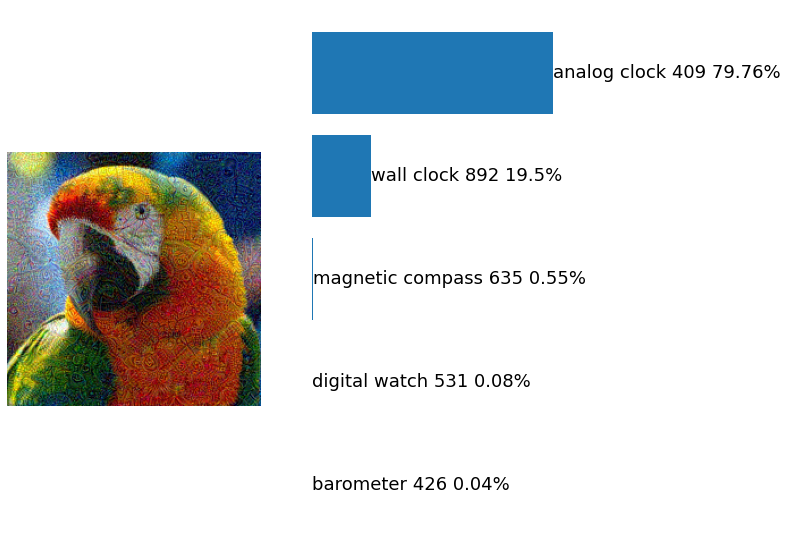

In [ ]:
classify_my_image(new_img)

## Style Transfer

In [ ]:
![ -e images.tar.bz2 ] || gdown 'https://drive.google.com/uc?id=18y17PXpo_Qwt2l_FF_7ODJYcQYEExOeF' -O images.tar.bz2
![ -d images ] || tar jxf images.tar.bz2

Downloading...
From: https://drive.google.com/uc?id=18y17PXpo_Qwt2l_FF_7ODJYcQYEExOeF
To: /content/images.tar.bz2
13.5MB [00:00, 51.3MB/s]


In [ ]:
def load_image(path, size=256):
    img = PIL.Image.open(path)
    img = img.convert("RGB")
    img = torchvision.transforms.Resize(size)(img)
    return numpy.asarray(img).astype("float32") / 255.0

In [ ]:
class StyleTransferNet(object):
    def __init__(
        self,
        style_layers,
        content_layers,
        vgg_model="vgg19",
        content_weight=5e0,
        style_weight=1e2,
    ):
        self.style_layers = style_layers
        self.style_captures = []
        self.style_weight = style_weight
        self.content_layers = content_layers
        self.content_captures = []
        self.content_weight = content_weight
        self.vgg = VGG(vgg_model)
        self.vgg.eval()
        for p in self.vgg.parameters():
            p.requires_grad = False
        self.mse = nn.MSELoss()

    def capture_content(self, x):
        self.content_captures = self.vgg.multi_layer_activations(vgg.preprocess(x), self.content_layers)

    def capture_style(self, x):
        style_layers = self.vgg.multi_layer_activations(vgg.preprocess(x), self.style_layers)
        self.style_captures = [self._gram_mat(l).detach() for l in style_layers]

    def get_loss(self, x):
        needed_layers = self.content_layers + self.style_layers
        needed_values = self.vgg.multi_layer_activations(vgg.preprocess(x), needed_layers)
        content_values = needed_values[: len(self.content_layers)]
        style_values = needed_values[len(self.content_layers) :]
        
        loss = 0
        if len(self.content_captures) > 0:
            self.content_losses = [self.mse(a, b) for a, b in zip(self.content_captures, content_values)]
            loss = sum(self.content_losses) * self.content_weight

        self.style_losses = [self.mse(a, self._gram_mat(b)) for a, b in zip(self.style_captures, style_values)]
        
        loss = loss + sum(self.style_losses) * self.style_weight

        return loss

    def _gram_mat(self, x):
	    b,c,h,w = x.size();
	    x = x.view(c, -1);
	    return torch.mm(x, x.t())

In [ ]:
def transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight):

    model = StyleTransferNet(
        style_layers = style_layers,
        content_layers = content_layers,
        content_weight = content_weight,
        style_weight = style_weight)

    if CUDA:
        model.vgg.cuda()


    style_img_size = 256
    content_img_size = 256

    style_image = load_image(style_img_path, style_img_size)
    content_image = load_image(content_img_path, content_img_size)
    content_shape = content_image.shape

    print("Capturing content")
    model.capture_content(to_tensor(content_image))

    print("Capturing style")
    model.capture_style(to_tensor(style_image))

    image = np.random.randn(*content_shape).astype(np.float32) * 0.01 + 0.5
    image = to_tensor(image, requires_grad=True)
    optimizer = torch.optim.LBFGS([image])

    max_iters = 500
    check_every = 10
    old_loss = np.inf
    tolerance = 0.00001
    try:
        fig = figure(figsize=(16, 10))
        fig.add_subplot(132).imshow(content_image)
        grid(False)
        fig.add_subplot(133).imshow(style_image)
        grid(False)
        ax = fig.add_subplot(131)

        tight_layout()
        imsh = ax.imshow(to_np(image))
        grid(False)
        for iter_ in range(max_iters):

            def closure():
                optimizer.zero_grad()
                loss = model.get_loss(image)
                loss.backward()
                return loss

            loss = optimizer.step(closure)
            # image.data = image.data.clip_(0, 1)

            if iter_ % check_every == 0:
                display.clear_output(wait=True)
                imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
                display.display(fig)

                print("Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.item()))
                for i, l in enumerate(model.content_losses):
                    print(
                        "  Content loss {}: {: >8.4f}".format(
                            i + 1, l.item() * model.content_weight
                        )
                    )
                for i, l in enumerate(model.style_losses):
                    print(
                        "  Style loss {}: {: >10.4f}".format(
                            i + 1, l.item() * model.style_weight
                        )
                    )

            old_loss = loss.item()
        display.clear_output(wait=True)
    except KeyboardInterrupt:
        display.clear_output(wait=True)
        print("Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.item()))

In [ ]:
def transfer_texture(style_img_path, style_layers):

    model = StyleTransferNet(style_layers = style_layers, style_weight=1e-3, content_layers=[])

    if CUDA:
        model.vgg.cuda()

    style_img_size = 256

    style_image = load_image(style_img_path, style_img_size)

    style_shape = style_image.shape

    print("Capturing style")
    model.capture_style(to_tensor(style_image))

    image = np.random.randn(*style_shape).astype(np.float32) * 0.01 + 0.5
    image = to_tensor(image, requires_grad=True)
    optimizer = torch.optim.LBFGS([image])

    max_iters = 500
    check_every = 10
    old_loss = np.inf
    tolerance = 0.00001
    try:
        fig = figure(figsize=(16, 10))
        fig.add_subplot(133).imshow(style_image)
        grid(False)
        ax = fig.add_subplot(131)

        tight_layout()
        imsh = ax.imshow(to_np(image))
        grid(False)
        for iter_ in range(max_iters):

            def closure():
                optimizer.zero_grad()
                loss = model.get_loss(image)
                loss.backward()
                return loss

            loss = optimizer.step(closure)
            # image.data = image.data.clip_(0, 1)

            if iter_ % check_every == 0:
                display.clear_output(wait=True)
                imsh.set_data(np.clip(to_np(image), 0.0, 1.0))
                display.display(fig)

                print("Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.item()))
                for i, l in enumerate(model.style_losses):
                    print(
                        "  Style loss {}: {: >10.4f}".format(
                            i + 1, l.item() * model.style_weight
                        )
                    )

            old_loss = loss.item()
        display.clear_output(wait=True)
    except KeyboardInterrupt:
        display.clear_output(wait=True)
        print("Iteration {0: >6} | loss {1: >10.7f}".format(iter_, loss.item()))

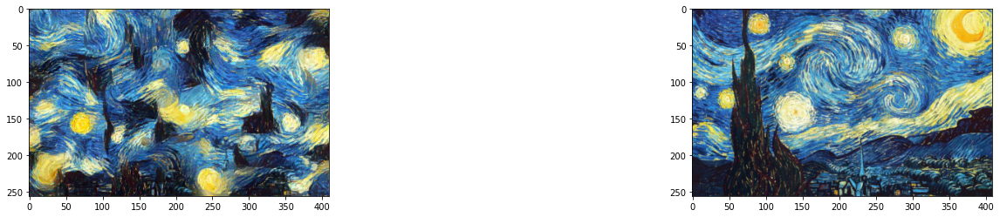

In [ ]:
style_img_path = "images/starry_night.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']

transfer_texture(style_img_path, style_layers)

Iteration     48 | loss 7702.3779297


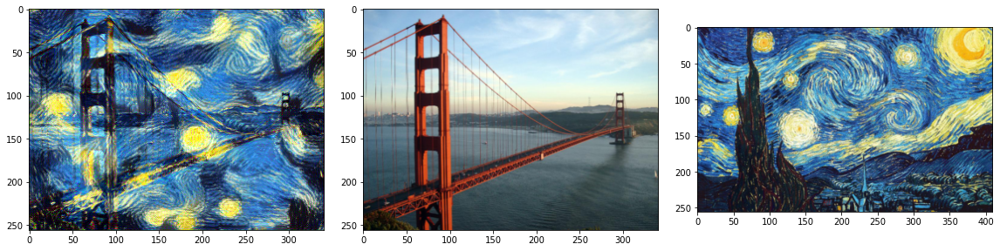

In [ ]:
style_img_path = "images/starry_night.jpg"
content_img_path = "images/golden_gate.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']
content_layers = ['conv2_2']
content_weight = 1e3
style_weight = 1e-3

transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight)

Iteration     66 | loss 906.3212891


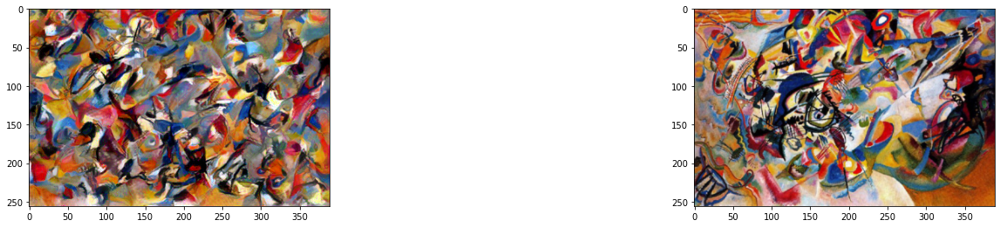

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/Vassily_Kandinsky,_1913_-_Composition_7.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']

transfer_texture(style_img_path, style_layers)

Iteration    167 | loss 13101.4130859


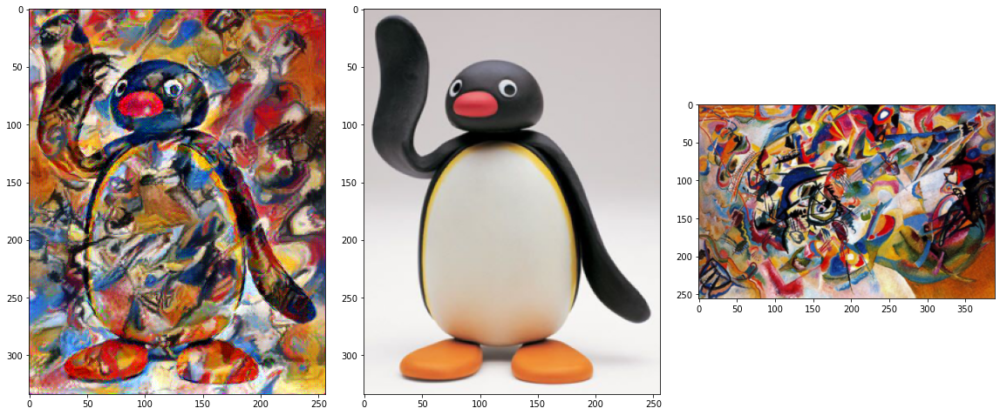

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/Vassily_Kandinsky,_1913_-_Composition_7.jpg"
content_img_path = "/content/drive/MyDrive/nnimages/pingu.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']
content_layers = ['conv2_2']
content_weight = 1e3
style_weight = 1e-3

transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight)

Iteration    157 | loss 68.3913651


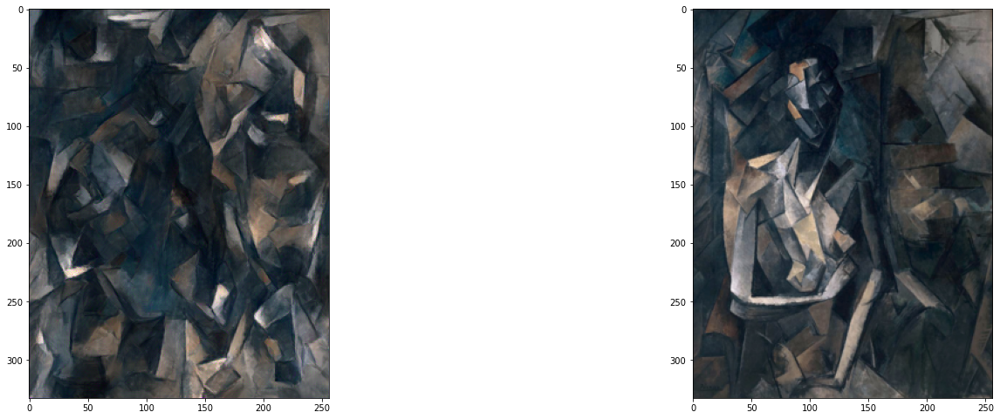

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/Femme nue assise.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']

transfer_texture(style_img_path, style_layers)

Iteration    108 | loss 36117.0117188


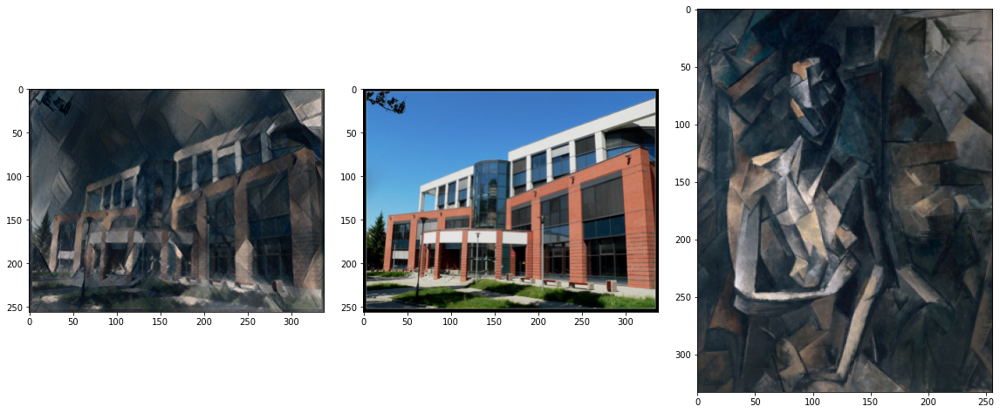

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/Femme nue assise.jpg"
content_img_path = "/content/drive/MyDrive/nnimages/uwr.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']
content_layers = ['conv2_2']
content_weight = 1e4
style_weight = 1e-2

transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight)

Iteration    218 | loss 16.0269909


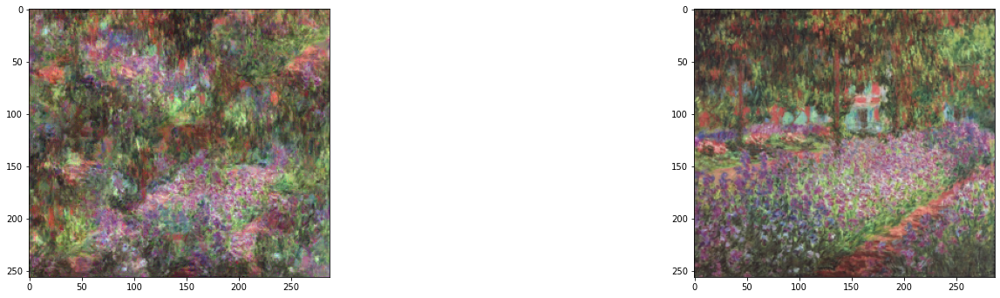

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/Monet_-_Monets_Garten_in_Giverny.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']

transfer_texture(style_img_path, style_layers)

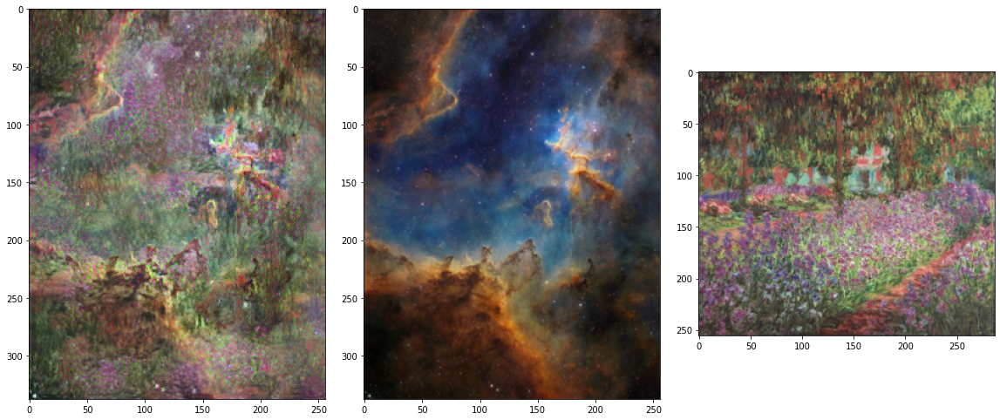

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/Monet_-_Monets_Garten_in_Giverny.jpg"
content_img_path = "/content/drive/MyDrive/nnimages/nebula.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']
content_layers = ['conv2_2']
content_weight = 1e3
style_weight = 1e-3

transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight)

Iteration    204 | loss  6.8201346


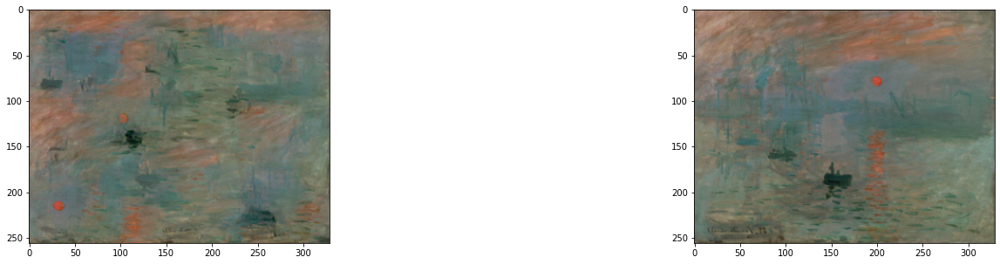

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/1280px-Monet_-_Impression,_Sunrise.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']

transfer_texture(style_img_path, style_layers)

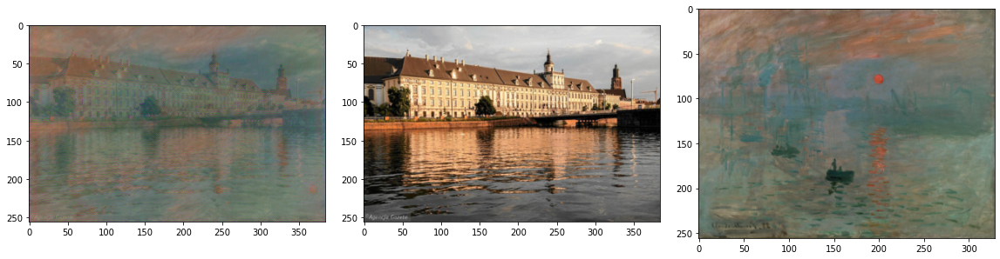

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/1280px-Monet_-_Impression,_Sunrise.jpg"
content_img_path = "/content/drive/MyDrive/nnimages/z22521392V,Uniwersytet-Wroclawski.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']
content_layers = ['conv2_2']
content_weight = 1e3
style_weight = 1e-3

transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight)

Iteration    111 | loss 188.8636932


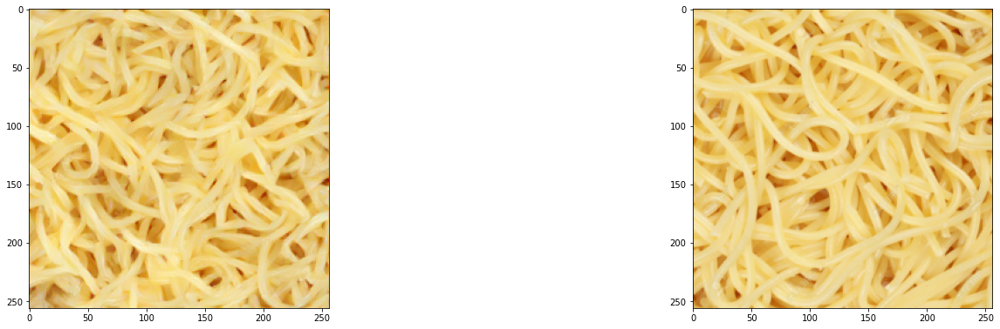

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/noodle.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']

transfer_texture(style_img_path, style_layers)

Iteration    154 | loss 29236.6230469


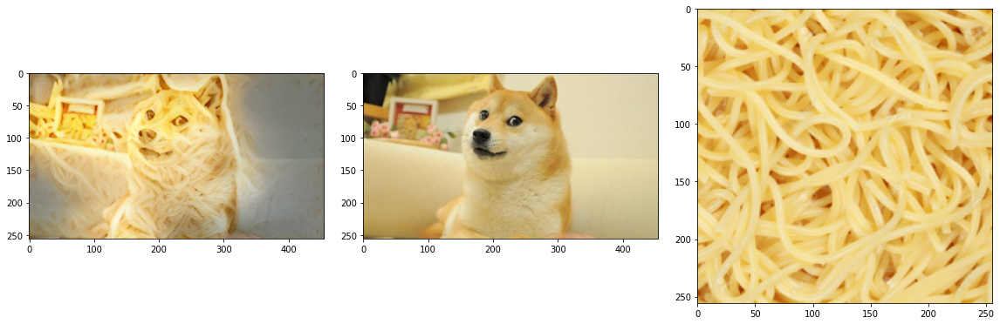

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/noodle.jpg"
content_img_path = "/content/drive/MyDrive/nnimages/doge.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']
content_layers = ['conv2_2']
content_weight = 1e4
style_weight = 1e-3

transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight)

Iteration    378 | loss 14893.5664062


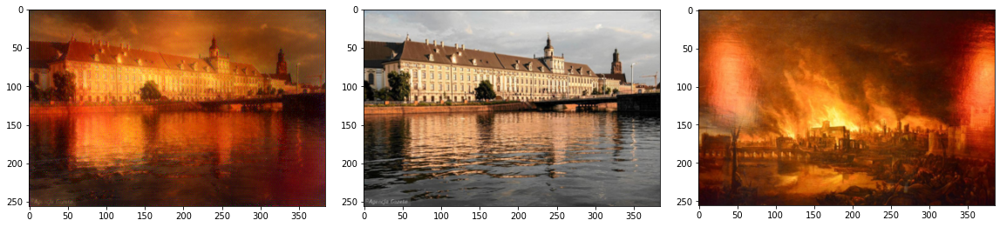

In [ ]:
style_img_path = "/content/drive/MyDrive/style_images/fire_of_london.jpg"
content_img_path = "/content/drive/MyDrive/nnimages/z22521392V,Uniwersytet-Wroclawski.jpg"

style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1']
content_layers = ['conv2_2']
content_weight = 1e4
style_weight = 1e-3

transfer_style(style_img_path, content_img_path, style_layers, content_layers, content_weight, style_weight)